In [4]:
# 来源 https://mp.weixin.qq.com/s/MtX6K1-Gy5s3zcsUTSeYZg
# 目标 DCIC牛只实例分割
# 类似代码

In [ ]:
# !pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [1]:
import cv2
import random
import json, os
from pycocotools.coco import COCO
from skimage import io
from matplotlib import pyplot as plt

C:\Users\10414\AppData\Roaming\Python\Python37\site-packages\skimage\io\manage_plugins.py:23: UserWarning: Your installed pillow version is < 8.1.2. Several security issues (CVE-2021-27921, CVE-2021-25290, CVE-2021-25291, CVE-2021-25293, and more) have been fixed in pillow 8.1.2 or higher. We recommend to upgrade this library.
  from .collection import imread_collection_wrapper


In [2]:
import detectron2
from pathlib import Path
import random, cv2, os
import matplotlib.pyplot as plt
import numpy as np
import pycocotools.mask as mask_util
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.logger import setup_logger
from detectron2.evaluation.evaluator import DatasetEvaluator
setup_logger()

<Logger detectron2 (DEBUG)>

## Visualize and train/valid Split

loading annotations into memory...
Done (t=0.11s)
creating index...
index created!


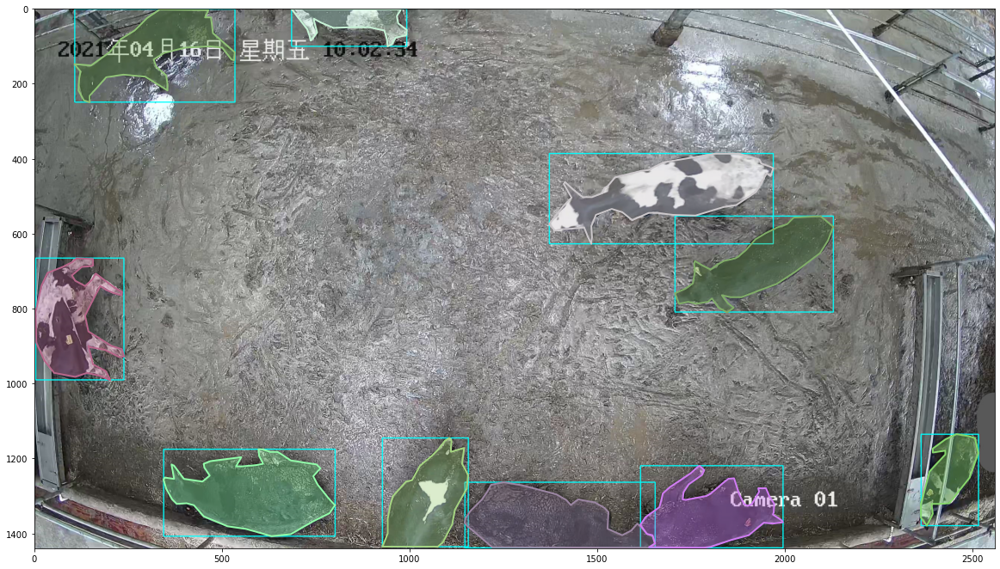

train: 160,valid: 40


In [3]:
train_dataset_dir="F:/Competition/DCIC/Cow/RawData/200/"
train_label="F:/Competition/DCIC/Cow/RawData/200/data.json"

#copy from https://blog.csdn.net/wtandyn/article/details/109751015

def visualization_bbox_seg(num_image, json_path, img_path, *str):# 需要画图的是第num副图片， 对应的json路径和图片路径

    coco = COCO(json_path)

    if len(str) == 0:
        catIds = []
    else:
        catIds = coco.getCatIds(catNms = [str[0]])  # 获取给定类别对应的id 的dict（单个内嵌字典的类别[{}]）
        catIds = coco.loadCats(catIds)[0]['id'] # 获取给定类别对应的id 的dict中的具体id

    list_imgIds = coco.getImgIds(catIds=catIds ) # 获取含有该给定类别的所有图片的id
    img = coco.loadImgs(list_imgIds[num_image-1])[0]  # 获取满足上述要求，并给定显示第num幅image对应的dict
    image = io.imread(img_path + img['file_name'])  # 读取图像
    image_name =  img['file_name'].split('/')[-1] # 读取图像名字
    image_id = img['id'] # 读取图像id

    img_annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None) # 读取这张图片的所有seg_id
    img_anns = coco.loadAnns(img_annIds)

    for i in range(len(img_annIds)):
        x, y, w, h = img_anns[i-1]['bbox']  # 读取边框
        image = cv2.rectangle(image, (int(x), int(y)), (int(x + w), int(y + h)), (0, 255, 255), 2)

    plt.rcParams['figure.figsize'] = (20.0, 20.0)
    plt.imshow(image)
    coco.showAnns(img_anns)
    plt.show()

visualization_bbox_seg(2, train_label, train_dataset_dir,'cow') # 最后一个参数不写就是画出一张图中的所有类别
with open(train_label,'r') as f:
    data=json.load(f)
#
train_dict={
    'images':[],
    'categories':[],
    'annotations':[]
}
val_dict={
    'images':[],
    'categories':[],
    'annotations':[]
}
train_dict['categories']=data['categories']
val_dict['categories']=data['categories']
images=data['images']
annos=data['annotations']
#20张用于验证
train_img_lst=[]
train_ann_lst=[]
val_img_lst=[]
val_ann_lst=[]
for i in range(len(images)):
    img_info=images[i]
    img_id=img_info['id']
    #遍历annos，找到对应image_id的所有标注
    tmp=[]
    for ann in annos:
            if ann['image_id']==img_id:
                tmp.append(ann)
    #
    if i%5==0:
        val_img_lst.append(img_info)
        val_ann_lst+=tmp
    else:
        train_img_lst.append(img_info)
        train_ann_lst+=tmp
#
train_dict['images']=train_img_lst
val_dict['images']=val_img_lst
train_dict['annotations']=train_ann_lst
val_dict['annotations']=val_ann_lst
print("train: {},valid: {}".format(len(train_img_lst),len(val_img_lst)))
#
with open('val.json','w') as f:
    tmp=json.dumps(val_dict)
    f.write(tmp)
with open('train.json','w') as f:
    tmp=json.dumps(train_dict)
    f.write(tmp)

In [4]:
dataDir=Path('F:/Competition/DCIC/Cow/RawData/200/')
cfg = get_cfg()
cfg.INPUT.MASK_FORMAT='bitmask'
register_coco_instances('cow_train',{}, 'train.json', dataDir)
register_coco_instances('cow_val',{},'val.json', dataDir)
metadata = MetadataCatalog.get('cow_train')
train_ds = DatasetCatalog.get('cow_train')

[02/21 19:35:02 d2.data.datasets.coco]: Loaded 160 images in COCO format from train.json


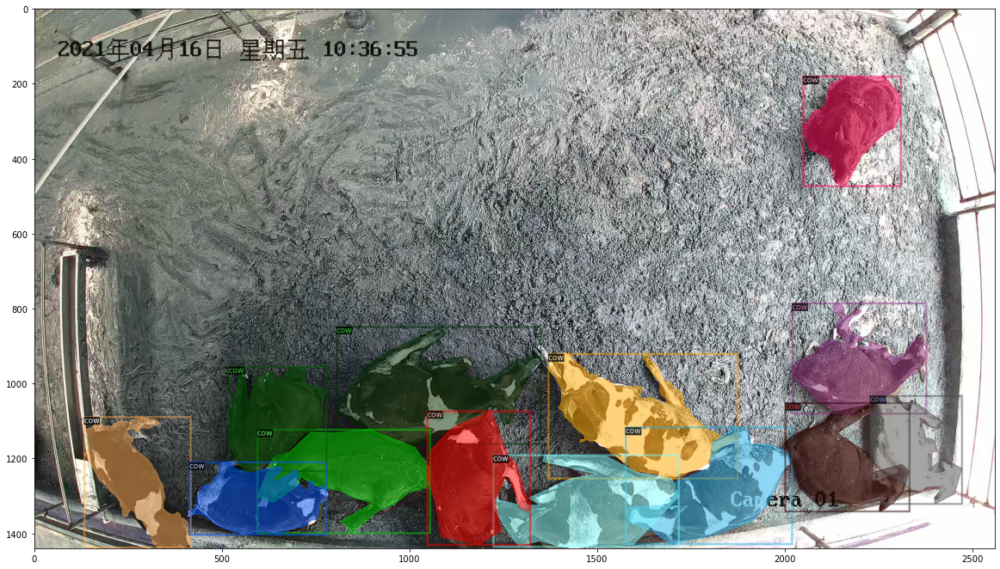

In [5]:
d = train_ds[42]
img = cv2.imread(d["file_name"])
visualizer = Visualizer(img[:, :, ::-1], metadata=metadata)
out = visualizer.draw_dataset_dict(d)
plt.figure(figsize = (20,15))
plt.imshow(out.get_image()[:, :, ::-1])

In [5]:
import logging
import os
from collections import OrderedDict
import torch
import copy
import detectron2.utils.comm as comm
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog
from detectron2.engine import DefaultTrainer, default_argument_parser, default_setup, hooks, launch
from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    CityscapesSemSegEvaluator,
    COCOEvaluator,
    COCOPanopticEvaluator,
    DatasetEvaluators,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    verify_results,
)
from detectron2.modeling import GeneralizedRCNNWithTTA
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader, build_detection_train_loader
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

def build_evaluator(cfg, dataset_name, output_folder=None):
    """
    Create evaluator(s) for a given dataset.
    This uses the special metadata "evaluator_type" associated with each builtin dataset.
    For your own dataset, you can simply create an evaluator manually in your
    script and do not have to worry about the hacky if-else logic here.
    """
    if output_folder is None:
        output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
    evaluator_list = []
    evaluator_type = MetadataCatalog.get(dataset_name).evaluator_type
    if evaluator_type in ["sem_seg", "coco_panoptic_seg"]:
        evaluator_list.append(
            SemSegEvaluator(
                dataset_name,
                distributed=True,
                output_dir=output_folder,
            )
        )
    if evaluator_type in ["coco", "coco_panoptic_seg"]:
        evaluator_list.append(COCOEvaluator(dataset_name, output_dir=output_folder))
    if evaluator_type == "coco_panoptic_seg":
        evaluator_list.append(COCOPanopticEvaluator(dataset_name, output_folder))
    if evaluator_type == "cityscapes_instance":
        return CityscapesInstanceEvaluator(dataset_name)
    if evaluator_type == "cityscapes_sem_seg":
        return CityscapesSemSegEvaluator(dataset_name)
    elif evaluator_type == "pascal_voc":
        return PascalVOCDetectionEvaluator(dataset_name)
    elif evaluator_type == "lvis":
        return LVISEvaluator(dataset_name, output_dir=output_folder)
    if len(evaluator_list) == 0:
        raise NotImplementedError(
            "no Evaluator for the dataset {} with the type {}".format(dataset_name, evaluator_type)
        )
    elif len(evaluator_list) == 1:
        return evaluator_list[0]
    return DatasetEvaluators(evaluator_list)

def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [
            T.RandomBrightness(0.9, 1.1),
            T.RandomContrast(0.9, 1.1),
            T.RandomSaturation(0.9, 1.1),
            T.RandomLighting(0.9),
            T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
            T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

class AugTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        return MAPIOUEvaluator(dataset_name)
    
class Trainer(DefaultTrainer):
    """
    We use the "DefaultTrainer" which contains pre-defined default logic for
    standard training workflow. They may not work for you, especially if you
    are working on a new research project. In that case you can write your
    own training loop. You can use "tools/plain_train_net.py" as an example.
    """
 
    @classmethod    
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        return build_evaluator(cfg, dataset_name, output_folder)

    @classmethod
    def test_with_TTA(cls, cfg, model):
        logger = logging.getLogger("detectron2.trainer")
        # In the end of training, run an evaluation with TTA
        # Only support some R-CNN models.
        logger.info("Running inference with test-time augmentation ...")
        model = GeneralizedRCNNWithTTA(cfg, model)
        evaluators = [
            cls.build_evaluator(
                cfg, name, output_folder=os.path.join(cfg.OUTPUT_DIR, "inference_TTA")
            )
            for name in cfg.DATASETS.TEST
        ]
        res = cls.test(cfg, model, evaluators)
        res = OrderedDict({k + "_TTA": v for k, v in res.items()})
        return res


In [6]:
class MAPIOUEvaluator(DatasetEvaluator):
    def __init__(self, dataset_name):
        dataset_dicts = DatasetCatalog.get(dataset_name)
        self.annotations_cache = {item['image_id']:item['annotations'] for item in dataset_dicts}
            
    def reset(self):
        self.scores = []

    def process(self, inputs, outputs):
        for inp, out in zip(inputs, outputs):
            if len(out['instances']) == 0:
                self.scores.append(0)    
            else:
                targ = self.annotations_cache[inp['image_id']]
                self.scores.append(score(out, targ))

    def evaluate(self):
        return {"MaP IoU": np.mean(self.scores)}

## training

In [ ]:
 # mask_rcnn_R_50_FPN_3x.yaml 对应模型已经修改

In [7]:
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")) # 查询模型 https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
# cfg.merge_from_file('F:/Competition/DCIC/Cow/CheckPoint/model_final_b7fbab.pkl')
cfg.DATASETS.TRAIN = ("cow_train",)
cfg.DATASETS.TEST = ("cow_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
# cfg.MODEL.WEIGHTS = 'F:/Competition/DCIC/Cow/CheckPoint/model_final_9243eb.pkl'
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0005 
cfg.SOLVER.MAX_ITER = 2000    
cfg.SOLVER.STEPS = []        
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  
#cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = .5
cfg.TEST.EVAL_PERIOD = 4*len(DatasetCatalog.get('cow_train')) // cfg.SOLVER.IMS_PER_BATCH  # Once per epoch


[02/21 19:35:17 d2.data.datasets.coco]: Loaded 160 images in COCO format from train.json


In [8]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = Trainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[02/21 19:35:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

[02/21 19:35:25 d2.data.datasets.coco]: Loaded 160 images in COCO format from train.json
[02/21 19:35:25 d2.data.build]: Removed 0 images with no usable annotations. 160 images left.
[02/21 19:35:25 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    cow     | 2056         |
|            |              |
[02/21 19:35:25 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[02/21 19:35:25 d2.data.build]: Using training sampler TrainingSampler
[02/21 19:35:25 d2.data.common]: Serializing 160 elements to byte tensors and concatenating them all ...
[02/21 19:35:25 d2.data.common]: Serialized dataset takes 1.36 MiB


Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[02/21 19:35:27 d2.engine.train_loop]: Starting training from iteration 0


C:\software\anaconda\envs\gpu\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/21 19:35:48 d2.utils.events]:  eta: 0:15:34  iter: 19  total_loss: 2.421  loss_cls: 0.7279  loss_box_reg: 0.8479  loss_mask: 0.6935  loss_rpn_cls: 0.08363  loss_rpn_loc: 0.05257  time: 0.4640  data_time: 0.2537  lr: 9.9905e-06  max_mem: 7204M
[02/21 19:35:58 d2.utils.events]:  eta: 0:15:16  iter: 39  total_loss: 2.319  loss_cls: 0.6675  loss_box_reg: 0.8299  loss_mask: 0.6804  loss_rpn_cls: 0.07804  loss_rpn_loc: 0.05454  time: 0.4731  data_time: 0.0360  lr: 1.998e-05  max_mem: 7225M
[02/21 19:36:07 d2.utils.events]:  eta: 0:14:45  iter: 59  total_loss: 2.216  loss_cls: 0.5813  loss_box_reg: 0.8408  loss_mask: 0.6516  loss_rpn_cls: 0.06675  loss_rpn_loc: 0.04973  time: 0.4650  data_time: 0.0090  lr: 2.997e-05  max_mem: 7225M
[02/21 19:36:16 d2.utils.events]:  eta: 0:14:31  iter: 79  total_loss: 2.106  loss_cls: 0.525  loss_box_reg: 0.8706  loss_mask: 0.6092  loss_rpn_cls: 0.04442  loss_rpn_loc: 0.04575  time: 0.4606  data_time: 0.0078  lr: 3.9961e-05  max_mem: 7225M
[02/21 19:36:25

[02/21 19:37:43 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[02/21 19:37:43 d2.evaluation.testing]: copypaste: 49.3581,78.2182,57.5276,nan,33.9764,49.8358
[02/21 19:37:43 d2.utils.events]:  eta: 0:13:58  iter: 159  total_loss: 1.66  loss_cls: 0.3935  loss_box_reg: 0.8165  loss_mask: 0.3819  loss_rpn_cls: 0.02455  loss_rpn_loc: 0.04149  time: 0.4573  data_time: 0.0066  lr: 7.9921e-05  max_mem: 7250M
[02/21 19:37:52 d2.utils.events]:  eta: 0:13:50  iter: 179  total_loss: 1.579  loss_cls: 0.3689  loss_box_reg: 0.8106  loss_mask: 0.3425  loss_rpn_cls: 0.02193  loss_rpn_loc: 0.04397  time: 0.4571  data_time: 0.0068  lr: 8.991e-05  max_mem: 7250M
[02/21 19:38:01 d2.utils.events]:  eta: 0:13:43  iter: 199  total_loss: 1.418  loss_cls: 0.3238  loss_box_reg: 0.7566  loss_mask: 0.2943  loss_rpn_cls: 0.01501  loss_rpn_loc: 0.04371  time: 0.4575  data_time: 0.0080  lr: 9.9901e-05  max_mem: 7250M
[02/21 19:38:10 d2.utils.events]:  eta: 0:13:35  iter: 219  total_loss: 1.335  loss_cls

[02/21 19:39:27 d2.utils.events]:  eta: 0:12:47  iter: 339  total_loss: 0.7931  loss_cls: 0.193  loss_box_reg: 0.3505  loss_mask: 0.2061  loss_rpn_cls: 0.005416  loss_rpn_loc: 0.03734  time: 0.4613  data_time: 0.0069  lr: 0.00016983  max_mem: 7266M
[02/21 19:39:36 d2.utils.events]:  eta: 0:12:41  iter: 359  total_loss: 0.7713  loss_cls: 0.1917  loss_box_reg: 0.3274  loss_mask: 0.2095  loss_rpn_cls: 0.005999  loss_rpn_loc: 0.0385  time: 0.4616  data_time: 0.0090  lr: 0.00017982  max_mem: 7273M
[02/21 19:39:46 d2.utils.events]:  eta: 0:12:32  iter: 379  total_loss: 0.7566  loss_cls: 0.1824  loss_box_reg: 0.3338  loss_mask: 0.1999  loss_rpn_cls: 0.006629  loss_rpn_loc: 0.03712  time: 0.4619  data_time: 0.0070  lr: 0.00018981  max_mem: 7273M
[02/21 19:39:55 d2.utils.events]:  eta: 0:12:24  iter: 399  total_loss: 0.7442  loss_cls: 0.1721  loss_box_reg: 0.3352  loss_mask: 0.1947  loss_rpn_cls: 0.007328  loss_rpn_loc: 0.03537  time: 0.4623  data_time: 0.0071  lr: 0.0001998  max_mem: 7273M
[02

[02/21 19:41:16 d2.utils.events]:  eta: 0:11:21  iter: 539  total_loss: 0.6621  loss_cls: 0.1553  loss_box_reg: 0.278  loss_mask: 0.1816  loss_rpn_cls: 0.002712  loss_rpn_loc: 0.03162  time: 0.4635  data_time: 0.0070  lr: 0.00026973  max_mem: 7273M
[02/21 19:41:26 d2.utils.events]:  eta: 0:11:12  iter: 559  total_loss: 0.6707  loss_cls: 0.1512  loss_box_reg: 0.2907  loss_mask: 0.1899  loss_rpn_cls: 0.002642  loss_rpn_loc: 0.03359  time: 0.4644  data_time: 0.0069  lr: 0.00027972  max_mem: 7273M
[02/21 19:41:36 d2.utils.events]:  eta: 0:11:03  iter: 579  total_loss: 0.6439  loss_cls: 0.1389  loss_box_reg: 0.2828  loss_mask: 0.1784  loss_rpn_cls: 0.003023  loss_rpn_loc: 0.03316  time: 0.4650  data_time: 0.0071  lr: 0.00028971  max_mem: 7273M
[02/21 19:41:45 d2.utils.events]:  eta: 0:10:54  iter: 599  total_loss: 0.6518  loss_cls: 0.1443  loss_box_reg: 0.2715  loss_mask: 0.1804  loss_rpn_cls: 0.003614  loss_rpn_loc: 0.0321  time: 0.4653  data_time: 0.0068  lr: 0.0002997  max_mem: 7280M
[02

[02/21 19:43:08 d2.utils.events]:  eta: 0:09:50  iter: 739  total_loss: 0.5916  loss_cls: 0.1279  loss_box_reg: 0.2582  loss_mask: 0.1715  loss_rpn_cls: 0.002057  loss_rpn_loc: 0.03122  time: 0.4685  data_time: 0.0076  lr: 0.00036963  max_mem: 7280M
[02/21 19:43:17 d2.utils.events]:  eta: 0:09:41  iter: 759  total_loss: 0.5826  loss_cls: 0.125  loss_box_reg: 0.2449  loss_mask: 0.1724  loss_rpn_cls: 0.003315  loss_rpn_loc: 0.03241  time: 0.4690  data_time: 0.0075  lr: 0.00037962  max_mem: 7280M
[02/21 19:43:27 d2.utils.events]:  eta: 0:09:32  iter: 779  total_loss: 0.5829  loss_cls: 0.1209  loss_box_reg: 0.2519  loss_mask: 0.1658  loss_rpn_cls: 0.001954  loss_rpn_loc: 0.02694  time: 0.4693  data_time: 0.0068  lr: 0.00038961  max_mem: 7280M
[02/21 19:43:37 d2.data.datasets.coco]: Loaded 40 images in COCO format from val.json
[02/21 19:43:37 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_sty

[02/21 19:45:00 d2.utils.events]:  eta: 0:08:18  iter: 939  total_loss: 0.5426  loss_cls: 0.1137  loss_box_reg: 0.2344  loss_mask: 0.1643  loss_rpn_cls: 0.001669  loss_rpn_loc: 0.03038  time: 0.4718  data_time: 0.0072  lr: 0.00046953  max_mem: 7281M
[02/21 19:45:09 d2.data.datasets.coco]: Loaded 40 images in COCO format from val.json
[02/21 19:45:09 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[02/21 19:45:09 d2.data.common]: Serializing 40 elements to byte tensors and concatenating them all ...
[02/21 19:45:09 d2.data.common]: Serialized dataset takes 0.34 MiB
[02/21 19:45:09 d2.evaluation.evaluator]: Start inference on 40 batches
[02/21 19:45:16 d2.evaluation.evaluator]: Inference done 11/40. Dataloading: 0.0005 s/iter. Inference: 0.0492 s/iter. Eval: 0.1789 s/iter. Total: 0.2286 s/iter. ETA=0:00:06
[02/21 19:45:21 d2.evaluation.evaluator]: Inference done 33/40. Datal

[02/21 19:46:38 d2.data.common]: Serializing 40 elements to byte tensors and concatenating them all ...
[02/21 19:46:38 d2.data.common]: Serialized dataset takes 0.34 MiB
[02/21 19:46:38 d2.evaluation.evaluator]: Start inference on 40 batches
[02/21 19:46:44 d2.evaluation.evaluator]: Inference done 11/40. Dataloading: 0.0005 s/iter. Inference: 0.0526 s/iter. Eval: 0.1706 s/iter. Total: 0.2238 s/iter. ETA=0:00:06
[02/21 19:46:50 d2.evaluation.evaluator]: Inference done 34/40. Dataloading: 0.0006 s/iter. Inference: 0.0512 s/iter. Eval: 0.1720 s/iter. Total: 0.2239 s/iter. ETA=0:00:01
[02/21 19:46:51 d2.evaluation.evaluator]: Total inference time: 0:00:08.009034 (0.228830 s / iter per device, on 1 devices)
[02/21 19:46:51 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.050870 s / iter per device, on 1 devices)
[02/21 19:46:51 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[02/21 19:46:51 d2.evaluation.coco_evaluation]: Saving results to ./out

[02/21 19:48:21 d2.evaluation.evaluator]: Inference done 34/40. Dataloading: 0.0006 s/iter. Inference: 0.0512 s/iter. Eval: 0.1744 s/iter. Total: 0.2262 s/iter. ETA=0:00:01
[02/21 19:48:23 d2.evaluation.evaluator]: Total inference time: 0:00:08.088364 (0.231096 s / iter per device, on 1 devices)
[02/21 19:48:23 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.051353 s / iter per device, on 1 devices)
[02/21 19:48:23 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[02/21 19:48:23 d2.evaluation.coco_evaluation]: Saving results to ./output\inference\coco_instances_results.json
[02/21 19:48:23 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[02/21 19:48:23 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[02/21 19:48:23 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[02/21 19:48:23 d2.e

[02/21 19:49:53 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[02/21 19:49:53 d2.evaluation.coco_evaluation]: Saving results to ./output\inference\coco_instances_results.json
[02/21 19:49:53 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[02/21 19:49:53 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[02/21 19:49:53 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[02/21 19:49:53 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[02/21 19:49:53 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.731
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.977
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.890
 Average Precision  (AP) @[ 

[02/21 19:51:23 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[02/21 19:51:23 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[02/21 19:51:23 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.726
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.977
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.883
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.730
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.728
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.068
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.631
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.787
 Ave

[02/21 19:52:56 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[02/21 19:52:56 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[02/21 19:52:56 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.07 seconds.
[02/21 19:52:56 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[02/21 19:52:56 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.709
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.989
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.905
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.682
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDet

[02/21 19:54:28 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.709
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.989
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.894
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.687
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.710
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.065
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.603
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.753
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.723
 Average Recall     

[02/21 19:55:22 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[02/21 19:55:22 d2.engine.defaults]: Evaluation results for cow_val in csv format:
[02/21 19:55:22 d2.evaluation.testing]: copypaste: Task: bbox
[02/21 19:55:22 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[02/21 19:55:22 d2.evaluation.testing]: copypaste: 72.7958,98.5881,89.5862,nan,72.7831,72.9634
[02/21 19:55:22 d2.evaluation.testing]: copypaste: Task: segm
[02/21 19:55:22 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[02/21 19:55:22 d2.evaluation.testing]: copypaste: 71.1621,98.8734,89.3930,nan,66.9175,71.2747


## Infer Visualize

[02/21 19:55:53 d2.data.datasets.coco]: Loaded 40 images in COCO format from val.json


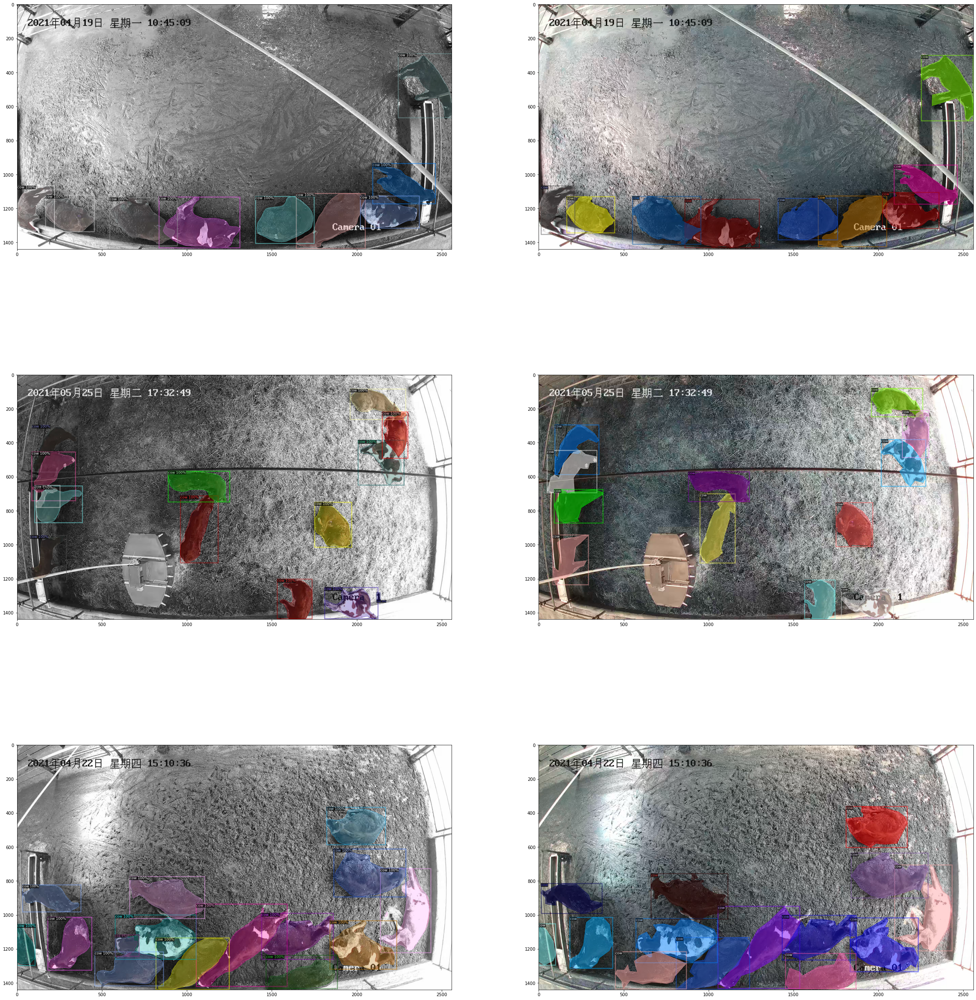

In [9]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
#cfg.MODEL.WEIGHTS = '../input/cow-seg-with-detectron-training/output/model_final.pth'
predictor = DefaultPredictor(cfg)
dataset_dicts = DatasetCatalog.get('cow_val')
outs = []
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata = MetadataCatalog.get('cow_train'), 
                    
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out_pred = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('cow_train'))
    out_target = visualizer.draw_dataset_dict(d)
    outs.append(out_pred)
    outs.append(out_target)
_,axs = plt.subplots(len(outs)//2,2,figsize=(40,45))
for ax, out in zip(axs.reshape(-1), outs):
    ax.imshow(out.get_image()[:, :, ::-1])


In [13]:
# 小测试，在清空内存后，还能不能预测图片
import gc
gc.collect()

87

## get the submit.json

In [14]:

#
from tqdm import tqdm
import pycocotools.mask as mask_util
pre_sub_json=[]
dataDir='F:/Competition/DCIC/Cow/RawData/Test/images'
ids, masks=[],[]
id_inx=0
image_id_inx=0
test_names = os.listdir(dataDir)
for name in tqdm(test_names):
    fn=os.path.join(dataDir,name)
    im = cv2.imread(fn)
    pred = predictor(im)
    image_id_inx+=1
    take = pred['instances'].scores >= 0.05
    instances=pred['instances']
    pred_masks_rle = [mask_util.encode(np.asfortranarray(mask)) for mask in instances.pred_masks[take].cpu()]
    pred_masks = pred_masks_rle
    pred_bboxs = instances.pred_boxes.tensor[take]
    pred_scores = instances.scores[take]
    pred_bboxs = pred_bboxs.cpu().numpy()
    pred_scores = pred_scores.cpu().numpy()
    for i in range(len(pred_masks)):
        id_inx+=1
        pre_sub={
              'image_id': '',
              'category_id': 1,
              'segmentation': {},
              'score': 1.
        }
        pre_sub['image_id']='images/'+name
        mask=pred_masks[i]
        counts=mask['counts']
        #mask['counts']=mask['counts'].decode('utf-8')
        counts=str(counts, encoding='utf-8')
        mask['counts']=counts
        bbox=pred_bboxs[i]
        score=pred_scores[i]
        pre_sub['segmentation']=mask
        pre_sub['score']=float(score)
        #x1=bbox[0]
        #y1=bbox[1]
        #w=bbox[2]-bbox[0]
        #h=bbox[3]-bbox[1]
        #pre_sub['bbox']=[int(bbox[0]),int(bbox[1]),int(w),int(h)]
        ##deal with segmentation
        #img=mask.astype(np.uint8)
        #img[img==1]=255
        #edge=cv2.Canny(img,30,100)
        #xs,ys=np.where(edge==255)
        #polygon=[]
        #for j in range(0,len(xs),10):
        #    polygon.append(int(xs[j]))
        #    polygon.append(int(ys[j]))
        #pre_sub['segmentation']=[polygon]
        #pre_sub['area']=int(w*h)
        #print(len(polygon))
        pre_sub_json.append(pre_sub)
    #break
len(pre_sub_json)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.92it/s]


1546

In [11]:
with open('submission_6.json','w') as f:
    data=json.dumps(pre_sub_json)
    f.write(data)